# ASSIGNMENT 4

### ANWESHA PAUL <br> MDS202213

In [15]:
# Import necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
from tqdm import tqdm
from skimage.exposure import match_histograms

# 1. 

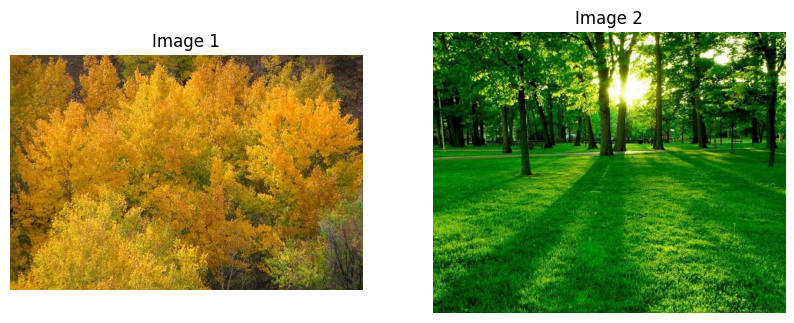

In [16]:
image1 = cv2.imread('image1.jpg')
image2 = cv2.imread('image2.jpg')

# Plotting the images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.title('Image 1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
plt.title('Image 2')
plt.axis('off')

plt.show()

## 1 (a)

In [17]:
def plot_channel(channel, title, cmap):
    plt.imshow(channel, cmap=cmap)
    plt.title(title)
    plt.colorbar()


def plot_histogram(channel, color):
    plt.hist(channel.flatten(), 256, [0, 256], color=color)
    plt.title(f'Histogram for {color.capitalize()} Channel')
    plt.ylabel('Frequency')


def extract_channels_and_plot_histograms(image):
    b, g, r = cv2.split(image)

    plt.figure(figsize=(12, 5))
    
    # Plotting color channels
    plt.subplot(2, 3, 1)
    plot_channel(b, 'Blue Channel', 'Blues')
    
    plt.subplot(2, 3, 2)
    plot_channel(g, 'Green Channel', 'Greens')
    
    plt.subplot(2, 3, 3)
    plot_channel(r, 'Red Channel', 'Reds')
    
    # Plotting histograms
    plt.subplot(2, 3, 4)
    plot_histogram(b, 'blue')
    
    plt.subplot(2, 3, 5)
    plot_histogram(g, 'green')
    
    plt.subplot(2, 3, 6)
    plot_histogram(r, 'red')

    plt.tight_layout()
    plt.show()

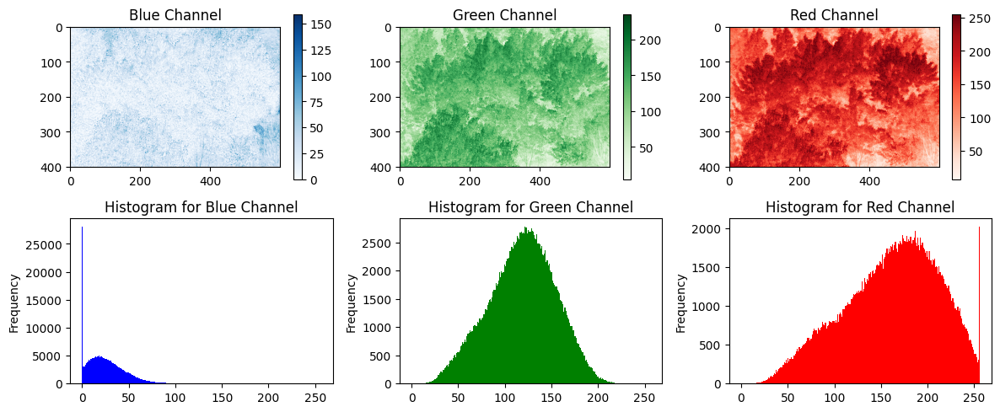

In [18]:
# Extract channels and plot histograms
extract_channels_and_plot_histograms(image1)

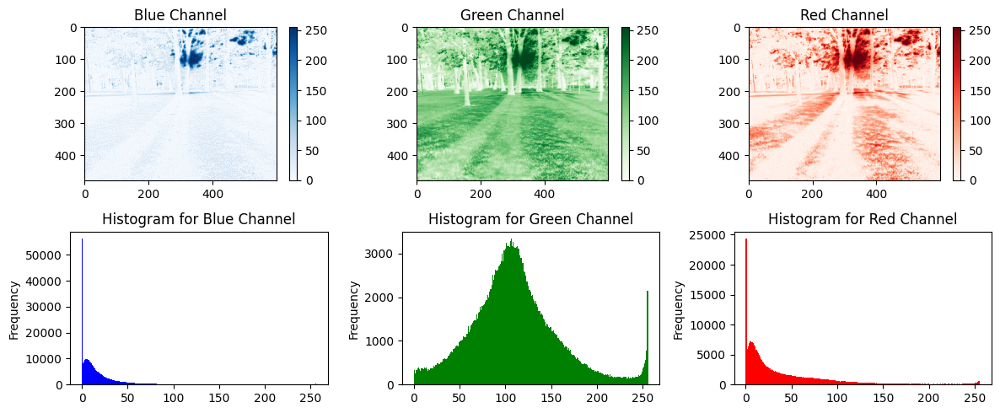

In [19]:
extract_channels_and_plot_histograms(image2)

## 1 (b)

In [20]:
def histMatching(scr_image, target_image, color):
    # assume both to be single channel images
    max_int = 256
    
    # plot the source, target and matched image
    matched_img = match_histograms(scr_image, target_image)

    fig, (axS, axT, axM) = plt.subplots(1, 3, figsize=(12, 3))

    # plot histogram of scr_image
    axS.hist(scr_image.ravel(), bins=max_int, range=[0,max_int], color=color)
    axS.set_title("Histogram of Source Channel")
    axS.set_xlabel("Intensity")
    axS.set_ylabel("Count")

    # plot histogram of target_image
    axT.hist(target_image.ravel(), bins=max_int, range=[0,max_int], color=color)
    axT.set_title("Histogram of Target Channel")
    axT.set_xlabel("Intensity")
    axT.set_ylabel("Count")


    # plot histogram of mathcedimg
    axM.hist(matched_img.ravel(), bins=max_int, range=[0,max_int], color=color)
    axM.set_title("Histogram of Matched Channel")
    axM.set_xlabel("Intensity")
    axM.set_ylabel("Count")

    plt.show()

    return matched_img

In [21]:
b1, g1, r1 = cv2.split(image1)
b2, g2, r2 = cv2.split(image2)

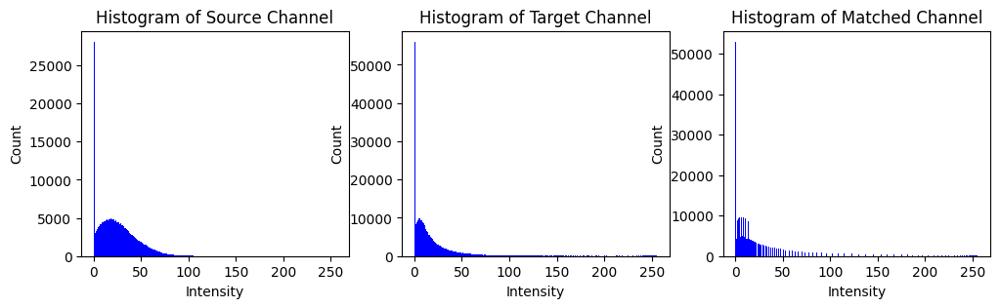

In [22]:
image1B_matched = histMatching(b1, b2, 'blue')

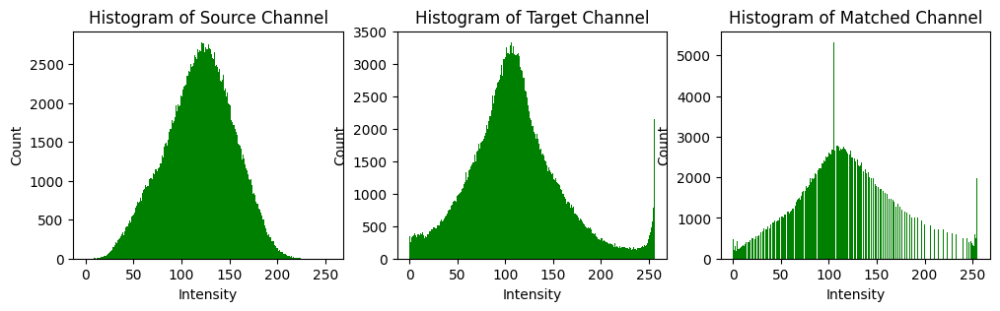

In [23]:
image1G_matched = histMatching(g1, g2, 'green')

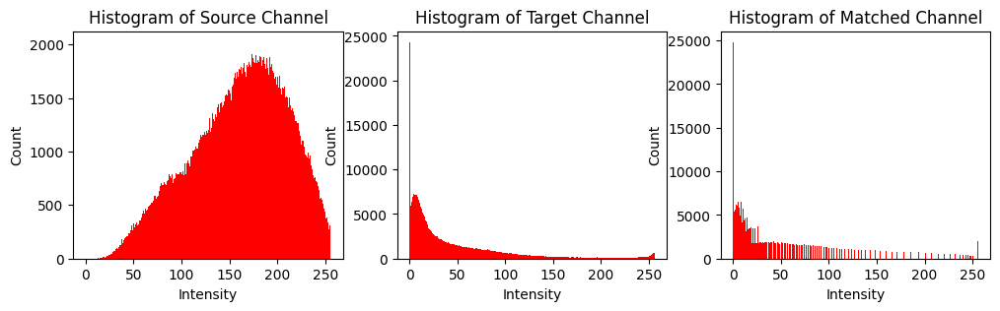

In [24]:
image1R_matched = histMatching(r1, r2, 'red')

## 1 (c)

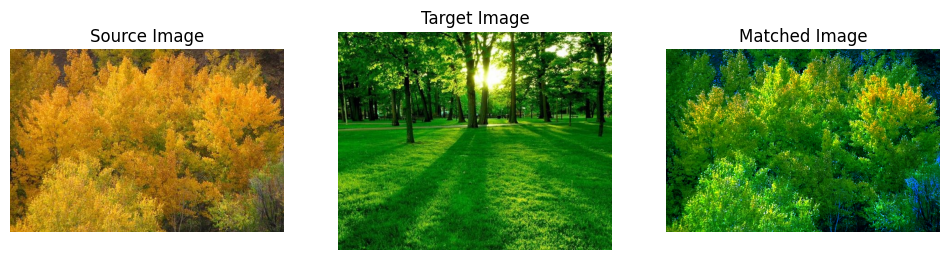

In [25]:
# combine matched channels
image1_matched = image1.copy()
image1_matched[:,:,0], image1_matched[:,:,1], image1_matched[:,:,2] = image1B_matched, image1G_matched, image1R_matched

# convert images from BGR to RGB 
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image1_matched = cv2.cvtColor(image1_matched, cv2.COLOR_BGR2RGB)

# plot the images
fig, (ax1, ax2, axM) = plt.subplots(1, 3, figsize=(12,5))

ax1.imshow(image1)
ax1.set_axis_off()
ax1.set_title("Source Image")

ax2.imshow(image2)
ax2.set_axis_off()
ax2.set_title("Target Image")

axM.imshow(image1_matched)
axM.set_axis_off()
axM.set_title("Matched Image")

plt.show()

## 1 (d)

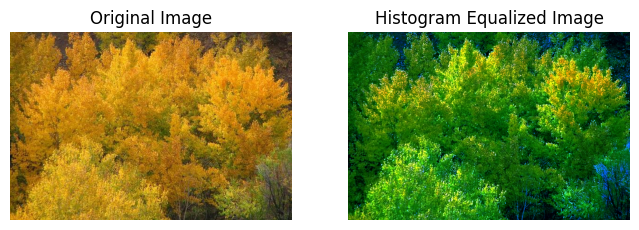

In [26]:
# comparing source and matched image side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,5))

# plot original image
ax1.imshow(image1)
ax1.set_axis_off()
ax1.set_title("Original Image")

# plot the eq_hist image
ax2.imshow(image1_matched)
ax2.set_axis_off()
ax2.set_title("Histogram Equalized Image")

plt.show()

# 2(a)

In [42]:
def get_odd_integer_input(prompt):
    while True:
        try:
            k = int(input(prompt))
            if k % 2 == 0:
                raise ValueError("Please enter an odd integer")
        except ValueError as e:
            print(e)
            continue
        else:
            break
    return k

In [43]:
def get_region_coordinates():
    print("Please specify the region of the image to be equalized\n")

    x1 = int(input("Enter x1, the starting row number: "))
    x2 = int(input("Enter x2, the ending row number: "))

    y1 = int(input("Enter y1, the starting column number: "))
    y2 = int(input("Enter y2, the ending column number: "))

    return x1, x2, y1, y2

In [44]:
def histogram_equalization(image, read_img=True, disp_graph=True, ret_image=False):
    # Reading image as grayscale
    if read_img:
        image = cv2.imread(image, 0)
  
    # Flattening image array and calculating histogram
    hist, bins = np.histogram(image.flatten(), 256, [0, 256])
    cdf = hist.cumsum()

    # Applying histogram equalization equation
    cdf_min = np.ma.masked_equal(cdf, 0)
    cdf_min = (cdf_min - cdf_min.min()) * 255 / (cdf_min.max() - cdf_min.min())
    cdf = np.ma.filled(cdf_min, 0).astype('uint8')

    if disp_graph:
        # Displaying images and histograms
        image_and_hist(image, 'Original Image')
        image_and_hist(cdf[image], 'Histogram Equalized Image')

        # Displaying Intensity Transformation
        intensity_hist(cdf)
      
        # Comparing results
        eq_image = cv2.equalizeHist(image)
        disp_subplots([cdf[image], eq_image], (1, 2), ['Image obtained from manual implementation',
                                                      'Image obtained using CV2'], '\n\nResult Comparison',
                                                      [None, None], (12, 8), 'gray')
  
    if ret_image:
        return cdf[image]

In [28]:
# Load the image
img = cv2.imread('image4.jpg', 0)

# Take inputs from the user
k = get_odd_integer_input("Enter an odd integer for the neighbourhood size (k): ")
x1, x2, y1, y2 = get_region_coordinates()

Please specify the region of the image to be equalized



## 2(b)

  0%|          | 0/505 [00:00<?, ?it/s]

100%|██████████| 505/505 [03:16<00:00,  2.57it/s]


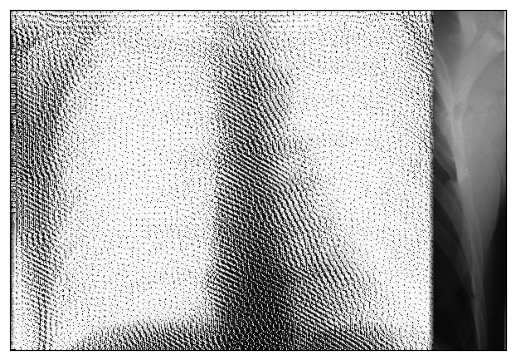

In [29]:
img1 = img.copy()
for j in tqdm(range(x1,x2-k,1)):
  for i in range(y1,y2-k,1):
    img1[i:i+k, j:j+k] = histogram_equalization(img1[i:i+k, j:j+k],
                                        read_img=False, disp_graph=False,
                                        ret_image=True)
# Displaying equalized image
plt.imshow(img1, cmap='gray')
plt.xticks([])
plt.yticks([])
plt.show()

## 2(c)

100%|██████████| 7/7 [00:00<00:00, 55.97it/s]


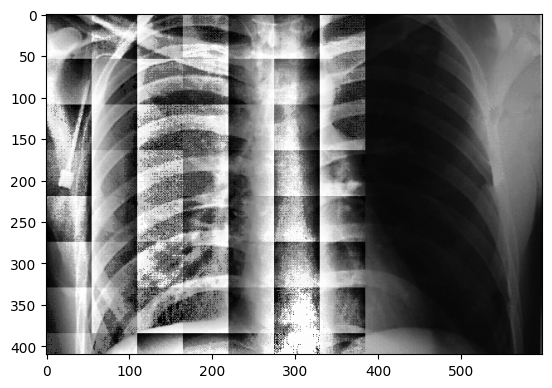

In [30]:
# Define block size and step size
k = 55
s = k  # Step size

# Define image dimensions
x1, y1 = 0, 0
x2, y2 = img.shape

# Create a copy of the original image
img2 = img.copy()

# Apply histogram equalization on each block separately
for j in tqdm(range(x1, x2 - k, s)):
    for i in range(y1, y2 - k, s):
        img2[i:i+k, j:j+k] = histogram_equalization(img2[i:i+k, j:j+k],
                                                    read_img=False, disp_graph=False,
                                                    ret_image=True)
        
# Display the combined image
plt.imshow(img2, cmap='gray')
plt.show()

### Results applying CLAHE with different clip limits

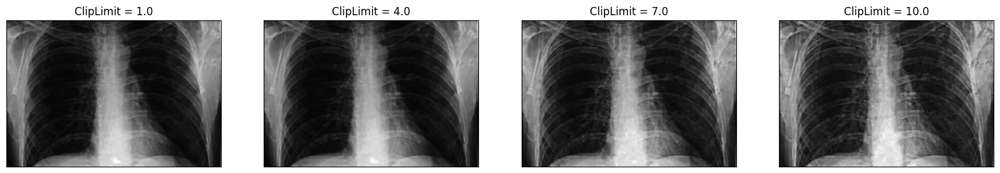

In [31]:
# Function to display subplots of images
def disp_subplots(images, shape, titles, sup_title, axes, figsize, cmap=None):
    fig, ax = plt.subplots(shape[0], shape[1], figsize=figsize)
    ax = ax.ravel()

    for i, image in enumerate(images):
        if cmap is None:
            ax[i].imshow(image)
        else:
            ax[i].imshow(image, cmap=cmap)

        if axes[i] is None:
            ax[i].set_xticks([])
            ax[i].set_yticks([])

        if titles[i] is not None:
            ax[i].set_title(titles[i])

    if sup_title is not None:
        fig.suptitle(sup_title, fontsize=18)
    plt.show()

# Applying CLAHE with different clip limits
images, cl, titles = [], [], []

for i in range(1, 11, 3):
    cl.append(cv2.createCLAHE(clipLimit=i, tileGridSize=(55, 55)))
    images.append(cl[-1].apply(img))
    titles.append(f"ClipLimit = {float(i)}")

# Displaying subplots
disp_subplots(images, (1, 4), titles, '', [None]*4, (20, 5), cmap='gray')

## 2(d)
### Comparing Results from SWAHE and CLAHE

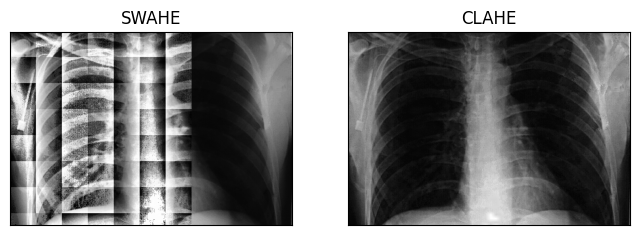

In [32]:
disp_subplots([img2, images[0]], (1,2), ["SWAHE", "CLAHE"], '', [None]*2, (8,5), cmap='gray')

We observe that the CLAHE method works significantly better than SWAHE on our image.

# 3.

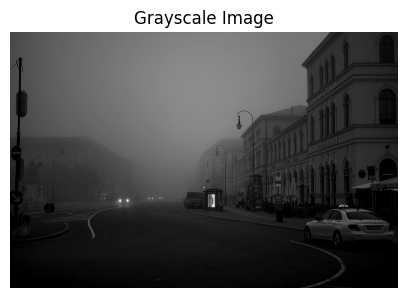

In [33]:
img_gray = cv2.imread('image3.jpg', cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(5,5))
plt.imshow(img_gray, cmap='gray')
plt.axis('off')
plt.title('Grayscale Image')
plt.show()

## 3 (a)

In [34]:
# intensity slicing by highlighting a particular range and setting the rest to zero

def apply_custom_transform(image, min_range, max_range):
    max_int = 256
    custom_transform = [0] * max_int
    
    for i in range(min_range, max_range):
        custom_transform[i] = 255
    
    transformed_image = np.copy(image)
    
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            transformed_image[i, j] = custom_transform[image[i, j]]
    
    return transformed_image, custom_transform

img_gray_transformed, custom_transform = apply_custom_transform(img_gray, 10, 60)  #min_range, max_range = 10, 60

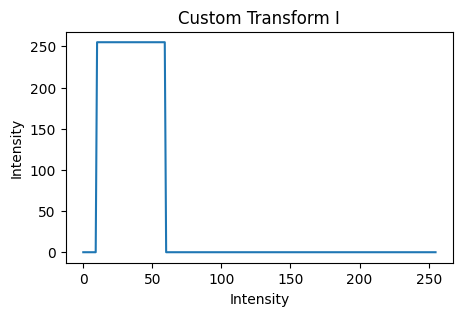

In [35]:
plt.figure(figsize=(5,3))
plt.plot(range(len(custom_transform)), custom_transform)
plt.xlabel("Intensity")
plt.ylabel("Intensity")
plt.title("Custom Transform I")
plt.show()

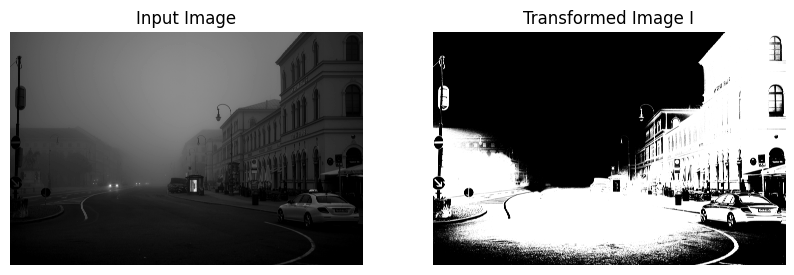

In [36]:
# comparing transformed image with input image side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))

# plot original image
ax1.imshow(img_gray, cmap='gray')
ax1.set_axis_off()
ax1.set_title("Input Image")

# plot the eq_hist image
ax2.imshow(img_gray_transformed, cmap='gray')
ax2.set_axis_off()
ax2.set_title("Transformed Image I")

plt.show()

## 3 (b)

In [37]:
def apply_custom_transform2(image, min_range, max_range):
    max_int = 256
    custom_transform = [i for i in range(max_int)]
    
    for i in range(min_range, max_range):
        custom_transform[i] = 255
    
    transformed_image = np.copy(image)
    
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            transformed_image[i, j] = custom_transform[image[i, j]]
    
    return transformed_image, custom_transform

img_gray_transformed2, custom_transform2 = apply_custom_transform2(img_gray, 10, 60)  #min_range, max_range = 10, 60

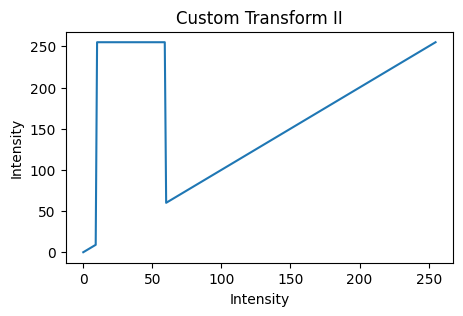

In [38]:
plt.figure(figsize=(5,3))
plt.plot(range(len(custom_transform2)), custom_transform2)
plt.xlabel("Intensity")
plt.ylabel("Intensity")
plt.title("Custom Transform II")
plt.show()

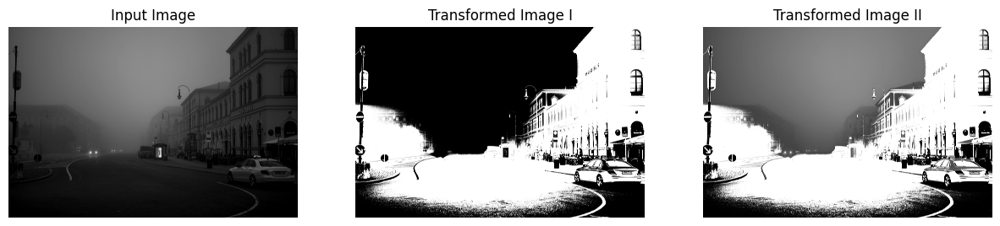

In [39]:
# comparing the transformed images with input image side by side
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,5))

# plot input grayscale image
ax1.imshow(img_gray, cmap='gray')
ax1.set_axis_off()
ax1.set_title("Input Image")

# plot for transformed image I
ax2.imshow(img_gray_transformed, cmap='gray')
ax2.set_axis_off()
ax2.set_title("Transformed Image I")

# plot for transformed image II
ax3.imshow(img_gray_transformed2, cmap='gray')
ax3.set_axis_off()
ax3.set_title("Transformed Image II")

plt.show()

## 4 (a)

In [330]:
def split_into_bitplanes(image):

    # Grayscale image
    if len(image.shape) == 2:  
        h, w = image.shape
        lst = []
        for i in range(h):
            for j in range(w):
                lst.append(np.binary_repr(int(image[i][j]), width=8))
    # RGB image
    else:
        h, w, c = image.shape
        lst = []
        for i in range(h):
            for j in range(w):
                lst.append(np.binary_repr(int(image[i][j][0]), width=8))

    bitplanes = []
    for i in range(8):
        bitplane = (np.array([int(j[i]) for j in lst], dtype=np.uint8) * 2 ** (7 - i)).reshape(h, w)
        bitplanes.append(bitplane)

    return bitplanes


def plot_bitplanes(bitplanes):
    f, axarr = plt.subplots(2, 4, figsize=(15, 5))

    for i in range(2):
        for j in range(4):
            axarr[i, j].imshow(bitplanes[i * 4 + j], cmap="gray")
            axarr[i, j].set_title(f"bitplane{i * 4 + j}")

    plt.show()

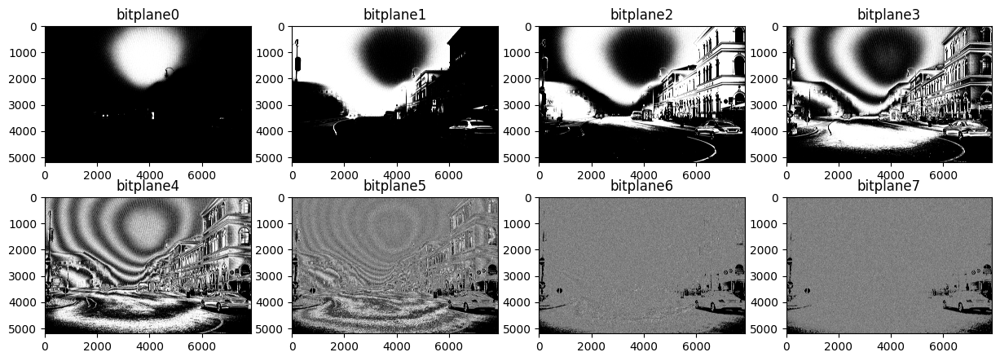

In [331]:
bitplanes = split_into_bitplanes(img_gray)
plot_bitplanes(bitplanes)

## 4 (b)

In [332]:
def get_bit_transform(n):
    max_int = 256
    transform = np.zeros((max_int), dtype='uint8')

    if n > 7:
        return None
    
    for i in range(1 << n, 1 << (n + 1)):
        transform[i] = i
    
    return transform

def plot_bit_transform(ax, transform, bit_label):
    ax.plot(range(len(transform)), transform)
    ax.set_title(f"{bit_label} Transform")

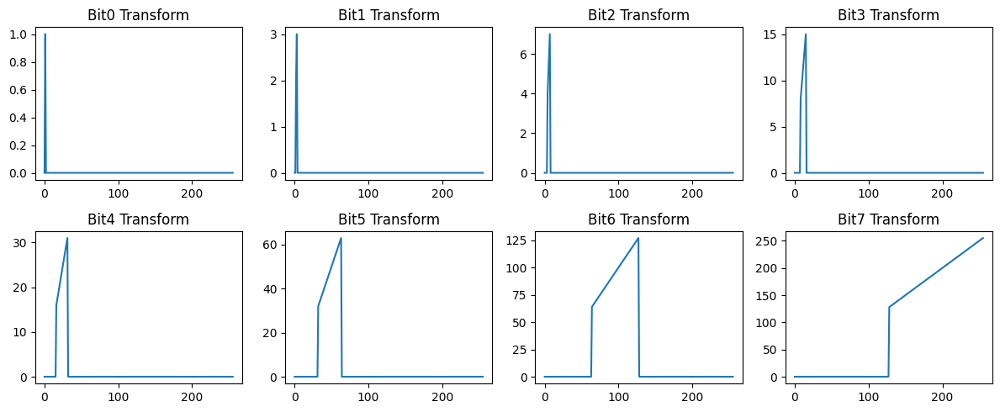

In [271]:
bit_transforms = []
for i in range(8):
    bit_transform = get_bit_transform(i)
    bit_transforms.append(bit_transform)

f, axarr = plt.subplots(2, 4, figsize=(12, 5))

for i in range(2):
    for j in range(4):
        plot_bit_transform(axarr[i, j], bit_transforms[i * 4 + j], f'Bit{i * 4 + j}')

plt.tight_layout()
plt.show()

## 4 (c)

In [292]:
def reconstruct_image(bitplanes, combination):
    '''
    Reconstruct the image using specified bit planes
    '''
    reconstructed_img = sum(bitplanes[i] for i in combination)
    return reconstructed_img


def display_images(images, combinations, ncols=3):
    '''
    Display the reconstructed image in a table-like format
    '''
    nrows = -(-len(images) // ncols)  # Ceiling division to calculate number of rows

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4 * ncols, 4 * nrows))
    fig.subplots_adjust(hspace=0.2, wspace=0.2)
    
    for i, (image, combination) in enumerate(zip(images, combinations)):
        row_idx = i // ncols
        col_idx = i % ncols
        ax = axes[row_idx, col_idx] if nrows > 1 else axes[col_idx]
        ax.imshow(image, cmap='gray')
        ax.axis(False)
        title = "Bit planes: " + ", ".join(str(bit) for bit in combination)
        ax.set_title(title)

    for ax in axes.flat:
        ax.label_outer()

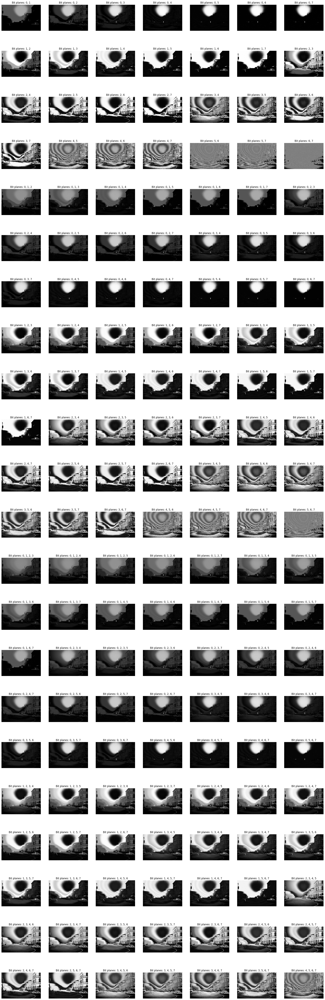

In [291]:
# Generate specific combinations of bit planes
specific_combinations = [list(combinations(range(8), r)) for r in range(2, 5)]

# Generate images for specific combinations
images = []
combinations_all = []

for combination_list in specific_combinations:
    for combination in combination_list:
        reconstructed_img = reconstruct_image(bitplanes, combination)
        images.append(reconstructed_img)
        combinations_all.append(combination)

# Display images in both row-wise and column-wise arrangements
display_images(images, combinations_all, ncols=7)
plt.show()

From the above combinations, we can see for the 4 bitplanes (0,1,2,5) we get a reasonable reconstruction of the original image

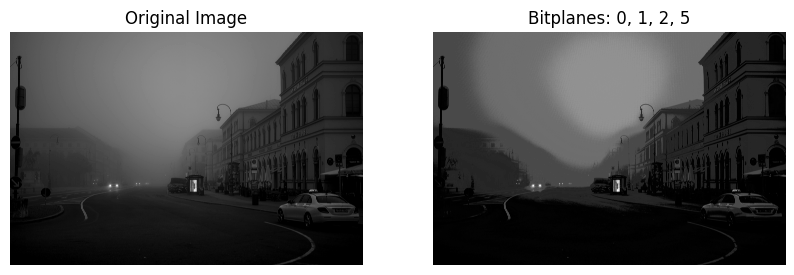

In [334]:
reconstructed_img = reconstruct_image(bitplanes, [0, 1, 2, 5])

# Display the original and reconstructed images side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Plot the original image
ax1.imshow(img_gray, cmap='gray')
ax1.set_title("Original Image")
ax1.axis('off')

# Plot the reconstructed image
ax2.imshow(reconstructed_img, cmap='gray')
ax2.set_title("Bitplanes: 0, 1, 2, 5")
ax2.axis('off')

plt.show()